### Parcelas afectadas a posible ensanche de calle

El objetivo de este trabajo es conocer qué parcelas y en qué medida se verán afectadas ante un posible ensanche de la calle 9 de Julio en Santa Fe

In [232]:
#Se importan las bibliotecas a utilizar
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px

Se tiene, para ello, un archivo shape con las calles de la ciudad y otro con las parcelas. De dichos archivos, se redujo la información solamente
a la zona entre boulevares, ya que ralentizaba los procesos

In [138]:
#Se lee el shape de parcelas
parc=gpd.read_file("C:/Users/Usuario/Documents/pytig22/evaluacion/evaluacion3/parcelario.zip")
parc.head(3)

,NOMENC,geometry
0,101102002400016,"POLYGON ((5432760.350 6498240.510, 5432755.250..."
1,101102003300041,"POLYGON ((5432100.481 6498394.967, 5432095.040..."
2,101102005500041,"POLYGON ((5432062.940 6498692.590, 5432061.050..."


In [139]:
#Se lee el shape de calles
calles=gpd.read_file("C:/Users/Usuario/Documents/pytig22/evaluacion/evaluacion3/calles.zip")
calles.head(3)

,CODIGO,TIPO,NOMBRE,geometry
0,1400,7,Bv Pellegrini,"LINESTRING (5432185.500 6500589.000, 5432170.5..."
1,3530,6,Av Lopez y Planes,"LINESTRING (5432163.000 6500581.000, 5432170.5..."
2,3530,6,Av Lopez y Planes,"LINESTRING (5432183.000 6500576.000, 5432185.5..."


In [140]:
#Se consulta el sistema de referencia en el que se encuentra la capa de parcelas
parc.crs

<Derived Projected CRS: PROJCS["POSGAR 2007 / Argentina 5",GEOGCS["POSGAR  ...>
Name: POSGAR 2007 / Argentina 5
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Posiciones Geodesicas Argentinas 2007
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [141]:
#Se hace lo mismo para la capa de calles
calles.crs

<Derived Projected CRS: PROJCS["POSGAR 94 / Argentina 5",GEOGCS["POSGAR 94 ...>
Name: POSGAR 94 / Argentina 5
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Posiciones Geodesicas Argentinas 1994
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [142]:
#Se transforma el sistema de referencia a la proyección Gauss-Krüger faja 5, con marco de referencia POSGAR07
parc=parc.to_crs(epsg=5347)
parc.crs

<Derived Projected CRS: EPSG:5347>
Name: POSGAR 2007 / Argentina 5
Axis Info [cartesian]:
- X[north]: Northing (metre)
- Y[east]: Easting (metre)
Area of Use:
- name: Argentina - between 61°30'W and 58°30'W onshore.
- bounds: (-61.51, -39.06, -58.5, -23.37)
Coordinate Operation:
- name: Argentina zone 5
- method: Transverse Mercator
Datum: Posiciones Geodesicas Argentinas 2007
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [143]:
#Lo mismo para la capa de calles
calles=calles.to_crs(epsg=5347)
calles_07.crs

<Derived Projected CRS: EPSG:5347>
Name: POSGAR 2007 / Argentina 5
Axis Info [cartesian]:
- X[north]: Northing (metre)
- Y[east]: Easting (metre)
Area of Use:
- name: Argentina - between 61°30'W and 58°30'W onshore.
- bounds: (-61.51, -39.06, -58.5, -23.37)
Coordinate Operation:
- name: Argentina zone 5
- method: Transverse Mercator
Datum: Posiciones Geodesicas Argentinas 2007
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

##### De la capa de calles, interesa filtrar solamente la 9 de Julio, en el tramo comprendido entre Gral. López y Bv. Pellegrini (este tramo se identificó en el archivo shapefile con el valor "10" en el atributo llamado "TIPO)

In [146]:
nv_jl=calles[calles["TIPO"]==10]
nv_jl.head(3)

,CODIGO,TIPO,NOMBRE,geometry
66,3090,10,9 de Julio,"LINESTRING (5433002.425 6500234.790, 5433034.9..."
106,3090,10,9 de Julio,"LINESTRING (5432974.152 6500117.104, 5433002.4..."
157,3090,10,9 de Julio,"LINESTRING (5432945.195 6499999.614, 5432974.1..."


In [147]:
#Calculamos el área de influencia, correspondiente a 12.50 metros a cada lado del eje de la calle; arrojando así un ancho de 25 metros (actualmente
#el ancho es de 15m)
nv_jl['geometry']=nv_jl.buffer(12.5)
nv_jl.head(3)

C:\Users\Usuario\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CODIGO,TIPO,NOMBRE,geometry
66,3090,10,9 de Julio,"POLYGON ((5433022.780 6500371.247, 5433023.128..."
106,3090,10,9 de Julio,"POLYGON ((5432990.271 6500237.710, 5432990.616..."
157,3090,10,9 de Julio,"POLYGON ((5432962.015 6500120.096, 5432962.366..."


<AxesSubplot:>

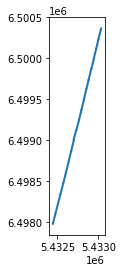

In [148]:
#Se realiza un plot para corroborar geométricamente el resultado obtenido
nv_jl.plot()

##### Se solapa la capa de parcelas con la capa obtenida en el buffer de las líneas anteriores, y se obtiene un nuevo GeoDataFrame con el
##### área afectada a ensanche en cada parcela 

In [149]:
parc_buf = parc.overlay(nv_jl, how='intersection')
parc_buf

,NOMENC,CODIGO,TIPO,NOMBRE,geometry
0,101102007700035,3090,10,9 de Julio,"POLYGON ((5432703.180 6498959.470, 5432697.810..."
1,101102006900035,3090,10,9 de Julio,"POLYGON ((5432660.720 6498869.620, 5432663.350..."
2,101102008600006,3090,10,9 de Julio,"POLYGON ((5432710.550 6499003.380, 5432708.290..."
3,101102008000015,3090,10,9 de Julio,"POLYGON ((5432675.207 6498945.590, 5432688.086..."
4,101102008000012,3090,10,9 de Julio,"POLYGON ((5432670.862 6498928.275, 5432675.207..."
...,...,...,...,...,...
404,101102010000010,3090,10,9 de Julio,"POLYGON ((5432745.370 6499149.540, 5432747.560..."
405,101102010400052,3090,10,9 de Julio,"POLYGON ((5432735.532 6499170.746, 5432732.229..."
406,101102012600004,3090,10,9 de Julio,"POLYGON ((5432763.465 6499266.966, 5432763.752..."
407,101102010400008,3090,10,9 de Julio,"POLYGON ((5432737.160 6499158.270, 5432732.670..."


<AxesSubplot:>

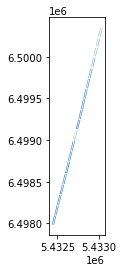

In [150]:
#Se visualiza geométricamente este resultado
parc_buf.plot()

In [151]:
#Se calcula la superficie afectada
parc_buf["SUP_AFECTADA"]=parc_buf.geometry.area
parc_buf.head(3)

,NOMENC,CODIGO,TIPO,NOMBRE,geometry,SUP_AFECTADA
0,101102007700035,3090,10,9 de Julio,"POLYGON ((5432703.180 6498959.470, 5432697.810...",31.773244
1,101102006900035,3090,10,9 de Julio,"POLYGON ((5432660.720 6498869.620, 5432663.350...",22.769462
2,101102008600006,3090,10,9 de Julio,"POLYGON ((5432710.550 6499003.380, 5432708.290...",52.269214


In [152]:
#A la tabla de parcelas, se calcula la superficie total de las mismas
parc["SUP_TOTAL"]=parc.geometry.area
parc.head(3)

,NOMENC,geometry,SUP_TOTAL
0,101102002400016,"POLYGON ((5432760.350 6498240.510, 5432755.250...",1229.074660
1,101102003300041,"POLYGON ((5432100.481 6498394.967, 5432095.040...",419.394197
2,101102005500041,"POLYGON ((5432062.940 6498692.590, 5432061.050...",233.992850


In [153]:
#Se unen las tablas que contienen los datos de superficie afectada y supericie total
parc_buff = parc_buf.merge(parc, on='NOMENC')
parc_buff.head()

,NOMENC,CODIGO,TIPO,NOMBRE,geometry_x,SUP_AFECTADA,geometry_y,SUP_TOTAL
0,101102007700035,3090,10,9 de Julio,"POLYGON ((5432703.180 6498959.470, 5432697.810...",31.773244,"POLYGON ((5432730.370 6498951.200, 5432725.870...",153.389950
1,101102006900035,3090,10,9 de Julio,"POLYGON ((5432660.720 6498869.620, 5432663.350...",22.769462,"POLYGON ((5432655.530 6498871.270, 5432660.720...",126.952500
2,101102006900035,3090,10,9 de Julio,"POLYGON ((5432660.720 6498869.620, 5432663.350...",102.489680,"POLYGON ((5432655.530 6498871.270, 5432660.720...",126.952500
3,101102008600006,3090,10,9 de Julio,"POLYGON ((5432710.550 6499003.380, 5432708.290...",52.269214,"POLYGON ((5432720.090 6499000.390, 5432710.550...",228.555144
4,101102008600006,3090,10,9 de Julio,"POLYGON ((5432710.550 6499003.380, 5432708.290...",55.849737,"POLYGON ((5432720.090 6499000.390, 5432710.550...",228.555144


##### El resultado final es un DataFrame que incluye la nomenclatura catastral de la parcela, la superficie afectada a ensanche de calle y la superficie total de la misma

In [154]:
tabla_final=parc_buff.drop(['CODIGO', 'TIPO','NOMBRE','geometry_x','geometry_y'], axis = 'columns')
tabla_final.head()

,NOMENC,SUP_AFECTADA,SUP_TOTAL
0,101102007700035,31.773244,153.389950
1,101102006900035,22.769462,126.952500
2,101102006900035,102.489680,126.952500
3,101102008600006,52.269214,228.555144
4,101102008600006,55.849737,228.555144


<AxesSubplot:title={'center':'Parcelas afectadas a ensanche de calle "9 de Julio"'}>

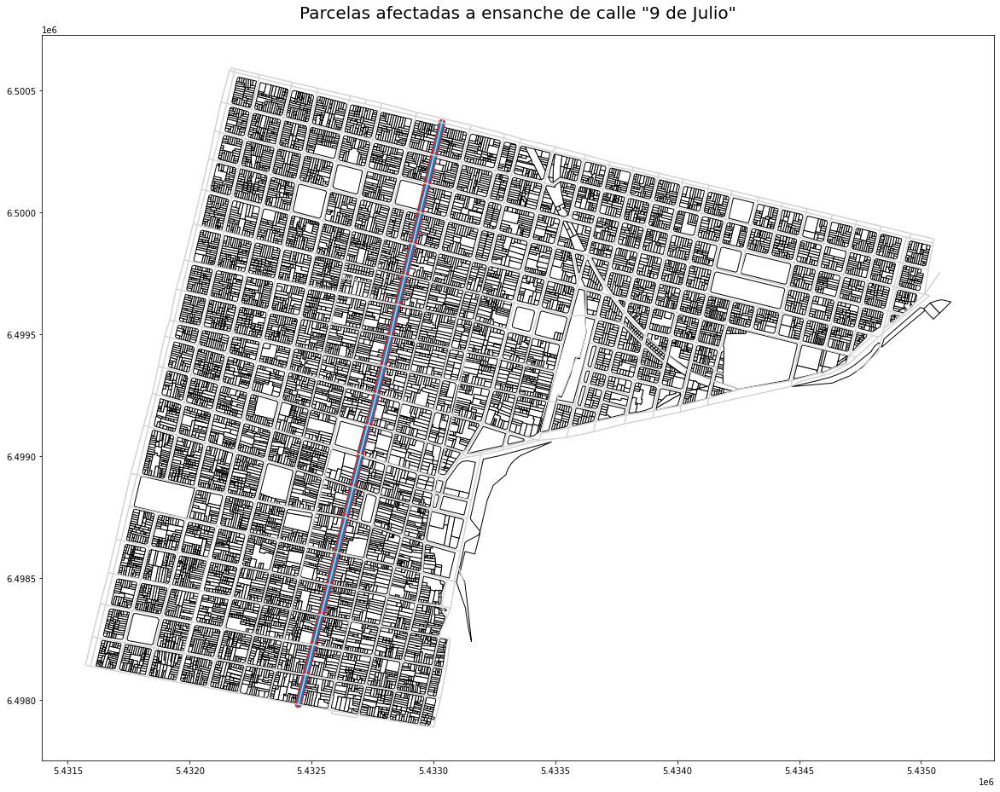

In [225]:
#Se genera un mapa, pero a una escala en la que no se aprecian en detalle las superficies afectadas
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_title('Parcelas afectadas a ensanche de calle "9 de Julio"', 
             pad = 20, 
             fontdict={'fontsize':20})
nv_jl.plot( ax=ax, zorder=50, edgecolor="red")
parc.plot(color='white', ax=ax, edgecolor="black")
calles.plot( ax=ax, zorder=50, edgecolor="lightgray")

##### Para visualizar los polígonos de una manera más interactiva, se utiliza el módulo "explore". La desventaja es que no se puede mostrar más de una capa en simultáneo

In [206]:
#Se aplica para la capa de parcelas
parc.explore(color="lightgray",tiles="CartoDB positron")

In [224]:
#Y Luego para los polígonos de afectación. Nótese que en gran parte de ellos, la parcela se encuentra edificada
parc_buf.explore(color="yellow",tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",attr=5)

##### Finalmente, se exporta dicha información en un archivo CSV como insumo para efectuar otros análisis

In [160]:
tabla_final.to_csv("C:/Users/Usuario/Documents/pytig22/evaluacion/evaluacion3/superficies_afectadas.csv")